# Модуль 4. Мультимодальные данные
---
## Федоров Георгий

In [1]:
import praw
import os
import random
import requests
from PIL import Image
import re
from io import BytesIO
import json
import pandas as pd
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import polars as pl
from tqdm import tqdm
import seaborn as sns

from IPython.display import clear_output

Итак, переходим к самому важному: у наших обработанных постов есть прикреплённые изображения.\
А ещё к постам можно отдельно парсить их комментарии, в которых можно найти множество результирующих изображений.

Так можно, наконец, собрать финальную часть искомых данных [изображение-инструкция-результаты]

## 1. Парсим исходную картинку

In [2]:
# для демонстрации в этой работе возьмём лишь небольшой сабсет, 
# иначе будет нереально по времени и памяти
df = pd.read_csv('posts_clean_fin.csv').drop(columns='Unnamed: 0').tail(500)
df

,link_flair_text,url,link_flair_css_class,id,created_utc,title,author,selftext,domain,num_comments,score,is_reddit_media_domain,total_awards_received,upvote_ratio,src,fulltext,text_len,is_popular
521716,Solved ✅,https://i.redd.it/ntk71cc8raue1.jpeg,solved,1jx4o9y,1.744417e+09,Request Touch Up For A Friend,enricopallazo,"Hello, this is a photo of my friend's father d...",i.redd.it,13.0,2.0,1.0,0.0,1.00,api,"Request Touch Up For A Friend; Hello, this is ...",282.0,False
521717,Solved ✅,https://i.redd.it/7f1cvlhkraue1.jpeg,solved,1jx4ole,1.744417e+09,Image needed for work,Reddit__Redux,Would love some help touching up this image fo...,i.redd.it,6.0,4.0,1.0,0.0,0.84,api,Image needed for work; Would love some help to...,243.0,False
521718,Solved ✅,https://i.redd.it/38g1rl7qsaue1.jpeg,solved,1jx4t20,1.744417e+09,Only picture of my husband’s grandparents.,bearlyawake2023,This picture of a photograph is the only pictu...,i.redd.it,14.0,7.0,1.0,0.0,1.00,api,Only picture of my husband’s grandparents.; Th...,321.0,True
521719,Solved ✅,https://i.redd.it/gujue53wsaue1.jpeg,solved,1jx4ulo,1.744418e+09,Move Pug closer to Daddy,MissMelTx,If you could move Mr.Pugglesworth closer to D...,i.redd.it,22.0,4.0,1.0,0.0,1.00,api,Move Pug closer to Daddy; If you could move Mr...,76.0,True
521720,Solved ✅,https://i.redd.it/hdur1yokuaue1.jpeg,solved,1jx50iy,1.744418e+09,I’d just like my head to be a little less swea...,EVasspiano,NaN,i.redd.it,5.0,2.0,1.0,0.0,1.00,api,I’d just like my head to be a little less swea...,105.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
522211,Free :snoo:,https://i.redd.it/3riv5d9s1yue1.jpeg,free,1jzl4db,1.744699e+09,Remove my double chin,divinemissn,My double chin here is disgusting but I want t...,i.redd.it,5.0,1.0,1.0,0.0,1.00,api,Remove my double chin; My double chin here is ...,149.0,False
522212,Free :snoo:,https://www.reddit.com/gallery/1jzl7hk,free,1jzl7hk,1.744699e+09,Family think this is my doppelgänger from history,ResponsibleSpread8,Hi so first pic is me and the old one is a ran...,reddit.com,2.0,4.0,0.0,0.0,1.00,api,Family think this is my doppelgänger from hist...,241.0,False
522213,Paid :redditgold:,https://i.redd.it/qybbrmg23yue1.jpeg,paid,1jzl83s,1.744699e+09,"Hi, turn these people into pirates, don't hesi...",FromBZH-French,NaN,i.redd.it,6.0,1.0,1.0,0.0,1.00,api,"Hi, turn these people into pirates, don't hesi...",94.0,False
522214,Paid :redditgold:,https://www.reddit.com/r/PhotoshopRequest/comm...,paid,1jzleq1,1.744700e+09,Swap Disney words,Visible_Dealer_5815,I have two PNG image files related to a Disney...,self.PhotoshopRequest,15.0,2.0,0.0,0.0,1.00,api,Swap Disney words; I have two PNG image files ...,219.0,False


Напоминаю - нам нужны картинки без ватермарок, так что целимся в 'free'

In [3]:
df['link_flair_css_class'].value_counts()

link_flair_css_class
solved    237
free      141
paid      121
Name: count, dtype: int64

In [4]:
df = df[df['link_flair_css_class'] == 'free']
len(df)

141

In [5]:
# разбираемся на одном примере
sample = df.sample(1)
sample

,link_flair_text,url,link_flair_css_class,id,created_utc,title,author,selftext,domain,num_comments,score,is_reddit_media_domain,total_awards_received,upvote_ratio,src,fulltext,text_len,is_popular
521991,Free :snoo:,https://i.redd.it/8jpjjfuhcsue1.png,free,1jywi5g,1.744630e+09,Can someone please remove my arm with the grap...,echamplin,NaN,i.redd.it,6.0,3.0,1.0,0.0,1.0,api,Can someone please remove my arm with the grap...,51.0,False


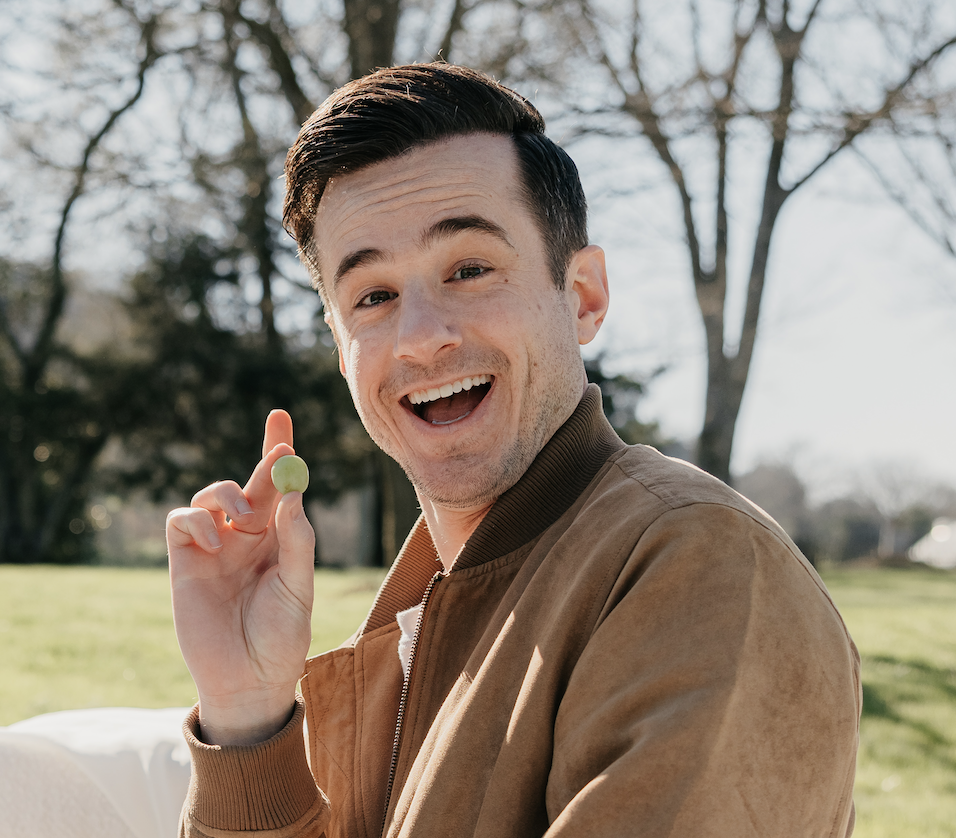

In [39]:
# как видим, URL лежит в отдельной колонке, используем его
response = requests.get(sample['url'].item(), stream=True)
response.raise_for_status()
orig_img = Image.open(BytesIO(response.content))

orig_img

Отлично, изображение есть!

## 2. Парсим ответы пользователей

Вытащить комментарии к посту, а затем картинки из них - не так просто, как оригинал.

In [13]:
# сначала нужно получить объект поста через praw
reddit = praw.Reddit('bot1')

post = reddit.submission(id=sample['id'].item())
post

Submission(id='1jywi5g')

In [15]:
# берём комментарии (сразу все), сортируем по скору
# (чтобы самые лучшие картинки всегда были первые)
post.comments.replace_more(limit=None)
top_comments = sorted(post.comments, key=lambda x: x.score, reverse=True)

In [35]:
top_comments

[Comment(id='mn1m735'),
 Comment(id='mn1ltux'),
 Comment(id='mn1m59y'),
 Comment(id='mn1m6kc'),
 Comment(id='mn1mymn')]

In [37]:
res = []
# пройдёмся по комментариям
for comment in top_comments:

    # пропускаем закреплённый комментарий - это сообщение бота-модератора
    if comment.stickied:
        continue
    
    # если комментирует автор поста - пропускаем
    if post.author and comment.author:
        if post.author.name == comment.author.name:
            continue

    # забираем картинку
    if hasattr(comment, "body"):
        # Extract URLs in comment
        for word in comment.body.split():
            if word.startswith("https://preview.redd.it/"):
                response = requests.get(word, stream=True)
                response.raise_for_status()
                img = Image.open(BytesIO(response.content))
                res.append(img)

Can someone please remove my arm with the grape? :)


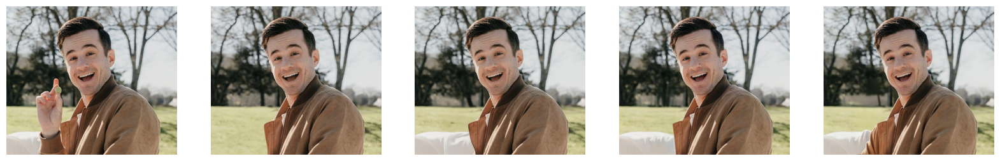

In [52]:
fig, ax = plt.subplots(1, (len(res)+1), figsize=(20, 10))
ax[0].imshow(orig_img)
ax[0].axis('off')
for i in range(len(res)):
    ax[i+1].imshow(res[i])
    ax[i+1].axis('off')

# инструкция
print(sample['fulltext'].item())

Отлично! Оригинал и 4 варианта редактирования!

Все результаты разные (фон за удалённой рукой везде разный)

Также в первом варианте удалена ещё и белая (подушка?) в левом нижнем углу.

In [79]:
# попробуем ещё что-нибудь
sample2 = df.sample(1)
sample2

,link_flair_text,url,link_flair_css_class,id,created_utc,title,author,selftext,domain,num_comments,score,is_reddit_media_domain,total_awards_received,upvote_ratio,src,fulltext,text_len,is_popular
521815,Free :snoo:,https://i.redd.it/pfec3x7eqiue1.jpeg,free,1jxy8ac,1.744514e+09,I can’t help but see disaster girl in this pic...,Icy_Inflation_3456,have your fun with this 😁,i.redd.it,3.0,3.0,1.0,0.0,1.0,api,I can’t help but see disaster girl in this pic...,88.0,False


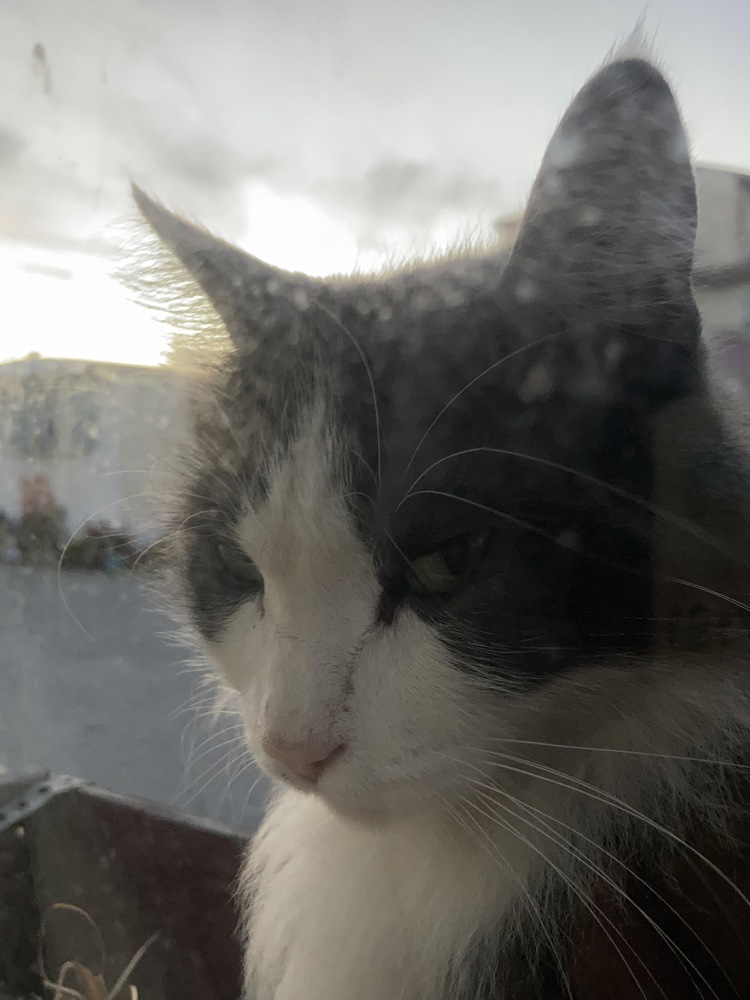

In [81]:
response = requests.get(sample2['url'].item(), stream=True)
response.raise_for_status()
orig_img2 = Image.open(BytesIO(response.content))

orig_img2

In [80]:
post2 = reddit.submission(id=sample2['id'].item())
post2

Submission(id='1jxy8ac')

In [82]:
# берём комментарии (сразу все), сортируем по скору
# (чтобы самые лучшие картинки всегда были первые)
post2.comments.replace_more(limit=None)
top_comments2 = sorted(post2.comments, key=lambda x: x.score, reverse=True)

In [83]:
top_comments2

[Comment(id='mmu71zt'), Comment(id='mmu8q7e'), Comment(id='mmubqcx')]

In [84]:
res2 = []
# пройдёмся по комментариям
for comment2 in top_comments2:

    # пропускаем закреплённый комментарий - это сообщение бота-модератора
    if comment2.stickied:
        continue
    
    # если комментирует автор поста - пропускаем
    if post2.author and comment2.author:
        if post2.author.name == comment2.author.name:
            continue

    # забираем картинку
    if hasattr(comment2, "body"):
        # Extract URLs in comment
        for word in comment2.body.split():
            if word.startswith("https://preview.redd.it/"):
                response = requests.get(word, stream=True)
                response.raise_for_status()
                img = Image.open(BytesIO(response.content))
                res2.append(img)

I can’t help but see disaster girl in this picture of my cat.; have your fun with this 😁


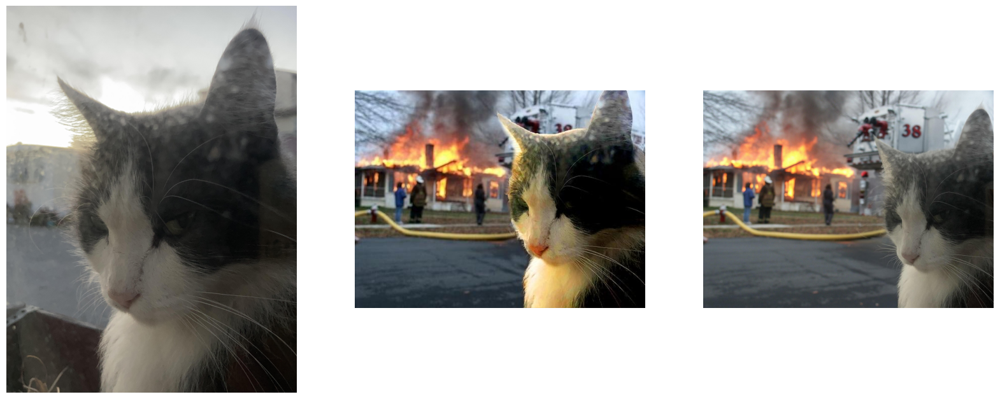

In [85]:
fig, ax = plt.subplots(1, (len(res2)+1), figsize=(20, 10))
ax[0].imshow(orig_img2)
ax[0].axis('off')
for i in range(len(res2)):
    ax[i+1].imshow(res2[i])
    ax[i+1].axis('off')

# инструкция
print(sample2['fulltext'].item())

Отлично!\
Этот пример показывает очень важную проблему:
> Мы разрабатываем модель для **попиксельного** редактирования.
> Это значит, что меняться должны только некоторые участки оригинала, остальное должно оставаться неизменным.
> Здесь же меняется размер и соотношение сторон картинки.

Так данные оставлять нельзя, но и удалять ценные картинки не хочется.
Как это обработать?

## 3. Поиск гомоморфизмов, алайнмент и кроп

Можно просто обрезать картинки-результаты так, чтобы соотношение сторон было одинаковым.

Но что именно обрезать и с какой стороны?\
Нам нужно, чтобы при наложении оригинала на результаты котики идеально накладывались друг на друга.

Для алайнмента изображений в классическом CV есть алгоритм SIFT.\
Он заключается в поиске "точек интереса" на изображениях, нахождении их гомоморфизмов, вычислении матрицы трансформации и применении её к изображению. После этого ожидается, что пара изображениий будет заалайнена. Затем нужно только кропнуть лишнее.

In [93]:
# Для этого я написал скрипт в отдельном файле, но приведу тут основную часть с пояснениями
import shutil

import cv2
import numpy as np
import os

# картинки в OpenCV, монохромные
original = cv2.cvtColor(np.array(orig_img2), cv2.COLOR_RGB2GRAY)
result = cv2.cvtColor(np.array(res2[0]), cv2.COLOR_RGB2GRAY)
color_result = cv2.cvtColor(np.array(res2[0]), cv2.COLOR_RGB2BGR)

if original is None or result is None:
    print(f"Error loading images: {original_path}, {result_path}")

# SIFT-фичи и дескрипторы
sift = cv2.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(original, None)
keypoints2, descriptors2 = sift.detectAndCompute(result, None)

# матчинг
index_params = dict(algorithm=1, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(descriptors1, descriptors2, k=2)

good_matches = []
for m, n in matches:
    if m.distance < 0.75 * n.distance:
        good_matches.append(m)

if len(good_matches) < 10:
    print(f"Not enough good matches for, skipping alignment.")

# получаем хорошие общие точки
src_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
dst_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)

# ищем гомографию
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

if H is None:
    print(f"Homography not found for, skipping.")

# применяем матрицу
h, w = original.shape
aligned_result = cv2.warpPerspective(color_result, H, (w, h))

# ищем черные области из-за смещения
gray_aligned = cv2.cvtColor(aligned_result, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(gray_aligned, 1, 255, cv2.THRESH_BINARY)
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if not contours:
    print(f"No valid content detected for, skipping.")

x, y, w_c, h_c = cv2.boundingRect(np.concatenate(contours))

if w_c < w or h_c < h:
    print(f"Black borders detected for, skipping.")

# ищем черные угловые области из-за вращения
mask_filled = np.zeros_like(gray_aligned, dtype=np.uint8)
cv2.drawContours(mask_filled, contours, -1, (255), thickness=cv2.FILLED)
black_pixel_ratio = np.sum(mask_filled == 0) / (h * w)

if black_pixel_ratio > 0.005:  # Adjust threshold if necessary
    print(f"Rotational black borders detected for, skipping.")

# проверяем AR
if abs((aligned_result.shape[1] / aligned_result.shape[0]) - (w / h)) > 0.01:
    print(f"Aspect ratio mismatch for, skipping.")

fin_res = Image.fromarray(cv2.cvtColor(aligned_result, cv2.COLOR_BGR2RGB))

Black borders detected for, skipping.
Rotational black borders detected for, skipping.


I can’t help but see disaster girl in this picture of my cat.; have your fun with this 😁


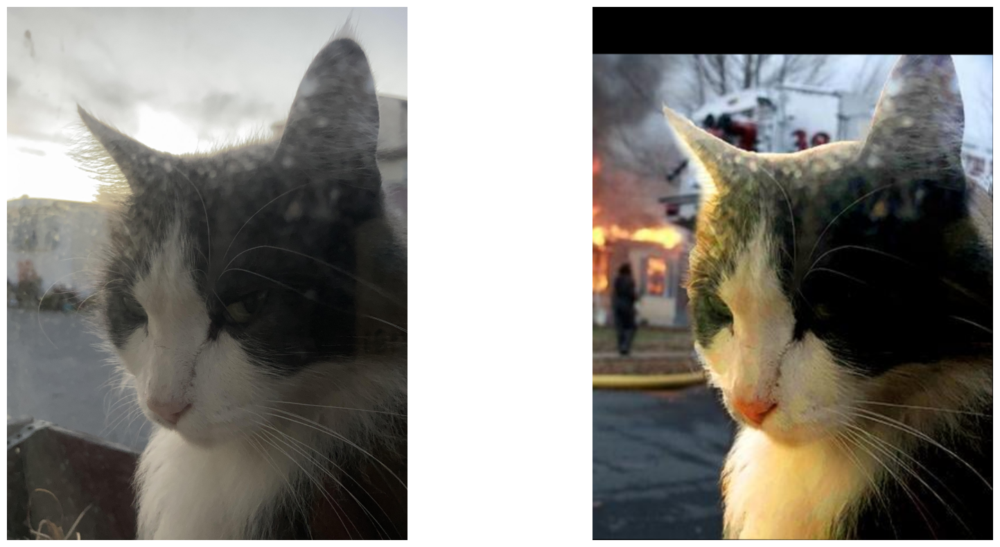

In [94]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(orig_img2)
ax[0].axis('off')
ax[1].imshow(fin_res)
ax[1].axis('off')

# инструкция
print(sample2['fulltext'].item())

Алгоритм сработал прекрасно!

Хотя в полном коде этот трезультат был бы удалён, поскольку сверху кропнутая чёрная полоса.\
Конечно, можно кропнуть по ней оригинал, но в общем случае это опасно:\
довольно часто в оригинале может кропнуться как-раз изменяемый участок, и инструкция + пара картинок потеряют всякий смысл

## 4. Рабочий пайплайн

Поскольку для сбора картинок из комментариев необходимо парсить пост через praw,\
получается, что мы парсим 2 раза: сначала забираем табличные данные, а затем картинки из комментариев.

С архивными данными ничего не поделаешь, а при работе со свежими данными через API это неэффективно.\
Поэтому я сооружид скрипт, который: 
- один раз проходится по топу постов за указанный участок времени,
- парсит все нужные табличные данные,
- проверяет выбросы, плохие данные, условия для парсинга картинок,
- парсит комментарии и картинки по небходимости,
- алайнит картинки через SIFT и удаляет плохие связки

Этот скрипт (+ полный скрипт для SIFT) я прикладываю в папку с этим ДЗ

In [95]:
# вот пример набора данных, спаршенных таким образом
df_i = pd.read_csv('free_data.csv').drop(columns='Unnamed: 0')
df_i

,img1_path,img2_path,title,body,img1_width,img1_height,img2_width,img2_height,post_id,post_score,post_flare,comment_author
0,photoshop_requests/free_aligned/1i5ox2x/origin...,photoshop_requests/free_aligned/1i5ox2x/result...,Can someone please help turn my brother into a...,NaN,1200,1599,1064,1417,1i5ox2x,19,free :snoo:,[to add]
1,photoshop_requests/free_aligned/1i5qfqz/origin...,photoshop_requests/free_aligned/1i5qfqz/result...,Please remove the woman from the back of the b...,NaN,2048,1365,2048,1365,1i5qfqz,4,free :snoo:,[to add]
2,photoshop_requests/free_aligned/1i5qfqz/origin...,photoshop_requests/free_aligned/1i5qfqz/result...,Please remove the woman from the back of the b...,NaN,2048,1365,2048,1365,1i5qfqz,4,free :snoo:,[to add]
3,photoshop_requests/free_aligned/1i5obgc/origin...,photoshop_requests/free_aligned/1i5obgc/result...,Make my cat see something crazy,NaN,1242,2208,1242,2208,1i5obgc,4,free :snoo:,[to add]
4,photoshop_requests/free_aligned/1i5o2uc/origin...,photoshop_requests/free_aligned/1i5o2uc/result...,Could anyone edit this photo so I have more ne...,Already tried uploading it and it was tagged a...,1536,2048,2580,3432,1i5o2uc,3,free :snoo:,[to add]
...,...,...,...,...,...,...,...,...,...,...,...,...
994,photoshop_requests/free_aligned/1j67g1z/origin...,photoshop_requests/free_aligned/1j67g1z/result...,GPT made this but didn’t completely mask the f...,NaN,1024,1024,1024,1024,1j67g1z,1,free :snoo:,Freilina
995,photoshop_requests/free_aligned/1j5z78q/origin...,photoshop_requests/free_aligned/1j5z78q/result...,Could someone please help me even out the ligh...,NaN,3872,2592,3872,2592,1j5z78q,1,free :snoo:,Public-Month6942
996,photoshop_requests/free_aligned/1j5z78q/origin...,photoshop_requests/free_aligned/1j5z78q/result...,Could someone please help me even out the ligh...,NaN,3872,2592,3872,2592,1j5z78q,1,free :snoo:,DonutArnold
997,photoshop_requests/free_aligned/1j5xqud/origin...,photoshop_requests/free_aligned/1j5xqud/result...,His first brace!,Can someone remove the post? Thank you!,2877,2000,2877,2000,1j5xqud,1,free :snoo:,Dzontra95


Мне сложно представить какой-то сложный EDA по этим данным.\
Довольно серьезное EDA уже инкорпорировано в SIFT: если данные будут плохими, они просто не сойдутся в SIFT.

Единственное, интересно посмотреть на распределение размеров изображений.

Размеры парсятся ДО обработки через SIFT, так что можно поглядеть на реальные размеры

In [97]:
df_i[['img1_width', 'img1_height', 'img2_width', 'img2_height']].describe()

,img1_width,img1_height,img2_width,img2_height
count,999.000000,999.000000,999.000000,999.000000
mean,2148.269269,2504.601602,2155.750751,2491.463463
std,1253.480775,1471.154262,1245.648372,1447.895760
min,108.000000,88.000000,354.000000,333.000000
25%,1170.000000,1280.000000,1157.000000,1296.500000
50%,1874.000000,2160.000000,1857.000000,2048.000000
75%,3024.000000,4000.000000,3024.000000,3908.500000
max,8242.000000,8064.000000,8242.000000,8064.000000


In [104]:
# реальные AR, до кропов
df_i['img1_aspect'] = df_i['img1_width'] / df_i['img1_height']
df_i['img2_aspect'] = df_i['img2_width'] / df_i['img2_height']
df_i['aspect_diff'] = abs(df_i['img1_aspect'] - df_i['img2_aspect'])

Лучше посмотреть графики

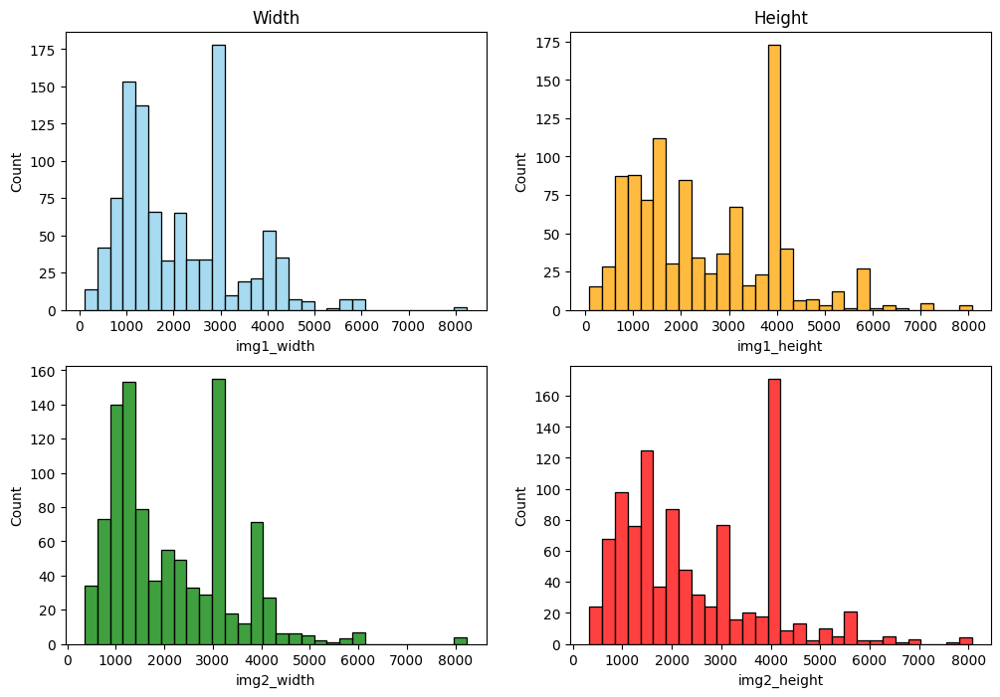

In [108]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
sns.histplot(df_i['img1_width'], bins=30, ax=axs[0,0], color='skyblue').set_title("Width")
sns.histplot(df_i['img1_height'], bins=30, ax=axs[0,1], color='orange').set_title("Height")
sns.histplot(df_i['img2_width'], bins=30, ax=axs[1,0], color='green')
sns.histplot(df_i['img2_height'], bins=30, ax=axs[1,1], color='red')

plt.show()

Интересный всплеск частоты 4k-картинок, также "выбросами" можно считать 8k-картинки.

Конечно, нам не важен размер и "выбросы" не нужно ни удалять, ни обособлять

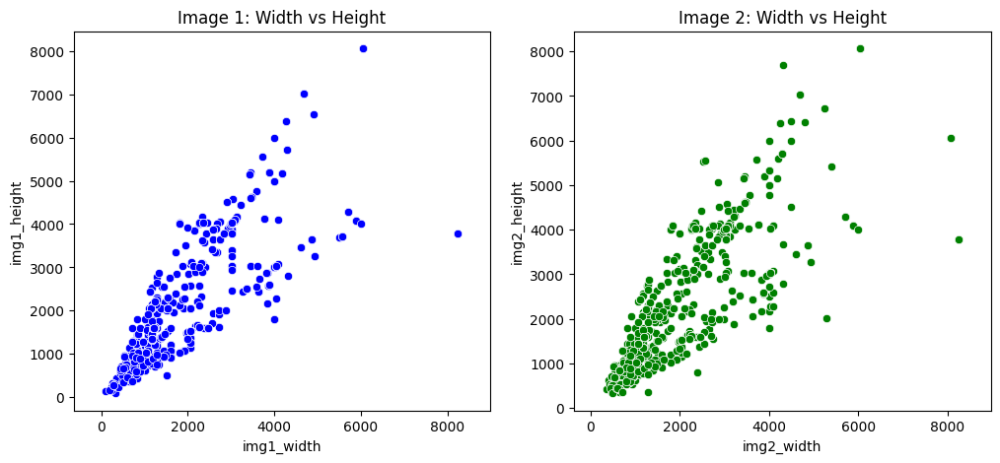

In [111]:
plt.figure(figsize=(12, 5))

# Image 1
plt.subplot(1, 2, 1)
sns.scatterplot(x='img1_width', y='img1_height', data=df_i, color='blue')
plt.title("Image 1: Width vs Height")
plt.axis('equal')

# Image 2
plt.subplot(1, 2, 2)
sns.scatterplot(x='img2_width', y='img2_height', data=df_i, color='green')
plt.title("Image 2: Width vs Height")
plt.axis('equal')

plt.show()

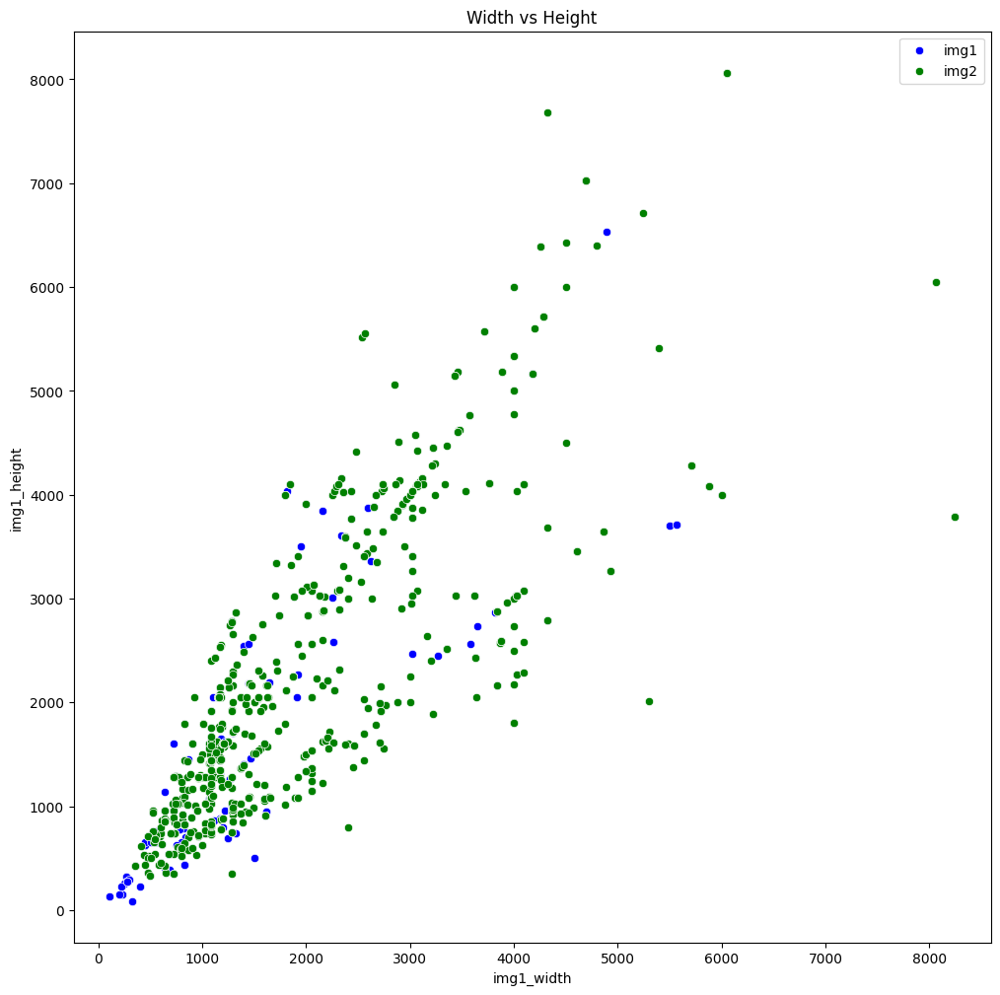

In [116]:
# Очень похожи, может, на одном графике?
plt.figure(figsize=(12, 12))

sns.scatterplot(x='img1_width', y='img1_height', data=df_i, color='blue', label='img1')
sns.scatterplot(x='img2_width', y='img2_height', data=df_i, color='green', label='img2')
plt.title("Width vs Height")
plt.axis('equal')
plt.legend()

plt.show()

Действительно, почти идеально накладываются.

Однако хорошо видно, что иногда просящие прикрепляют очень маленькие оригиналы,\
которые увеличиваются в любом результате (поэтому около (0, 0) только img1)

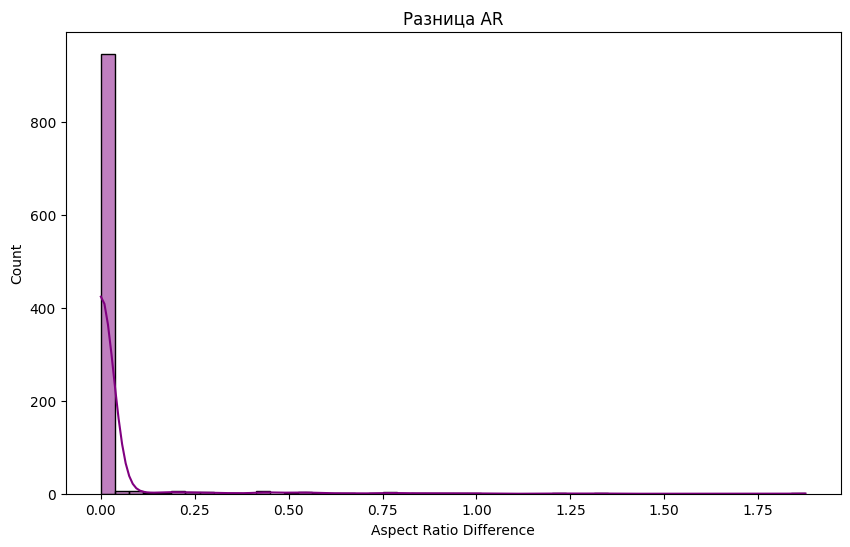

In [120]:
plt.figure(figsize=(10, 6))
sns.histplot(df_i['aspect_diff'], bins=50, kde=True, color='purple')
plt.title("Разница AR")
plt.xlabel("Aspect Ratio Difference")
plt.show()

Много пар одинакового AR, из-за них ничего не видно.

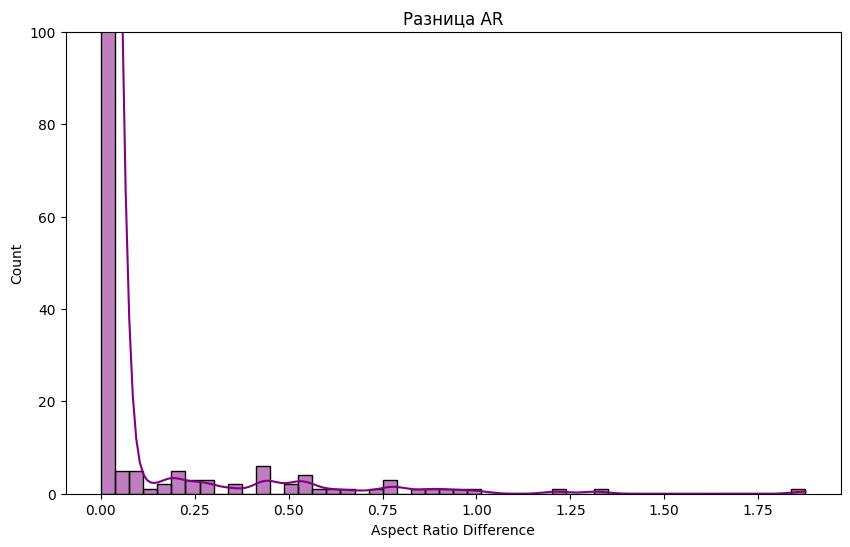

In [121]:
# приблизим
plt.figure(figsize=(10, 6))
sns.histplot(df_i['aspect_diff'], bins=50, kde=True, color='purple')
plt.title("Разница AR")
plt.xlabel("Aspect Ratio Difference")
plt.ylim(0, 100)
plt.show()

Теперь видна парочка "выбросов", где AR меняется в несколько раз.

Опять же, удалять их не будем - это сырые значения, SIFT уже с этим разобрался

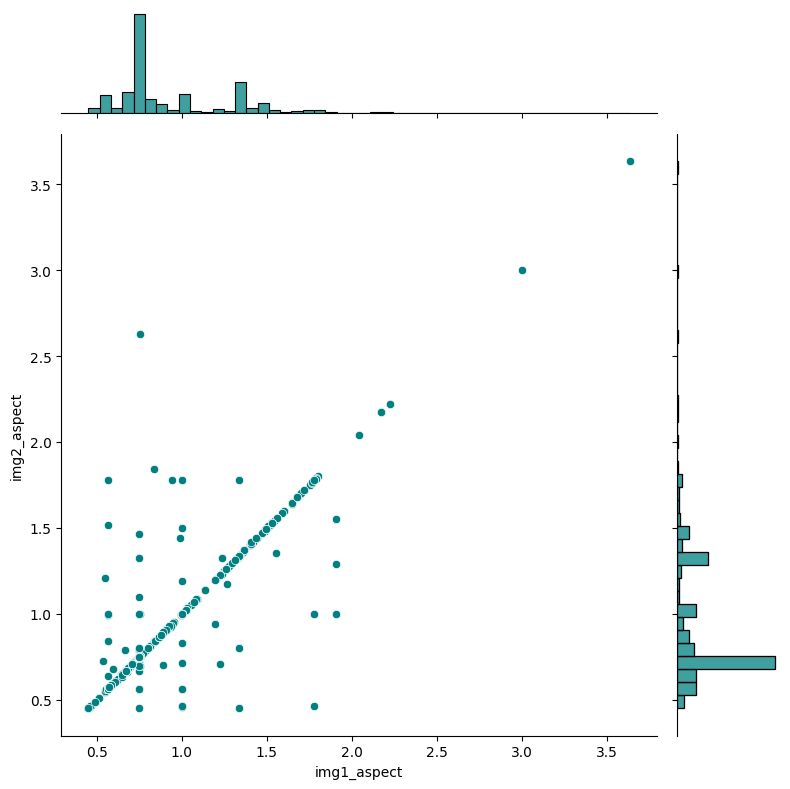

In [123]:
# ещё график сравнения AR
sns.jointplot(x='img1_aspect', y='img2_aspect', data=df_i, kind='scatter', height=8, color='teal')
plt.show()

## 5. Итоги

- [x]  Как и планировалось, дополнил датасет до мультимодальности картинками из постов и комментариев
- [x]  Сформировал мультимодальный датасет, разметка не требуется, однако некоторые проверки и обработки сделал
- [x]  Данные изначально связаны, мне осталось только правильно их извлечь
- [x]  Проведена серьезная обработка пар изображений: через систему проверок, алгоритм SIFT и ряд трансформаций и кропов изображения попиксельно приводятся друг к другу или отфильтровываются при невозможности. Весь процесс автоматизирован и находится в приложенных .py-скриптах
- [x]  EDA не требуется, но я исследовал размеры сырых изображений, построил графики, исследовал их соотношения сторон, нашел выбросы и интересные особенности
- [x]  Полученные мультимодальные данные могут быть очень полезны:
1. их можно, после некоторой дополнительной постобработки, напрямую подавать в архитектуры моделей-редакторов (в основном диффузионных, по типу Instruct-Pix2Pix)
2. поскольку изображения-результаты отсортированы по популярности, этот датасет можно использовать для обучения модели-ассессора качества работы крупной модели-редактора.
3. конечно, из этих данных можно извлечь серьезную статистику и закономерности для принятия решений.